In [1]:
# Standard stuff
import numpy as np
from matplotlib import pyplot as plt

# Utils
from utils.data_utils import load_data
from utils.plot_utils import newplot, hist_with_outline, hist_with_errors


import os, sys
os.environ["CUDA_VISIBLE_DEVICES"] = "-1"

# # ML stuff
from keras.layers import Dense, Dropout, Input, Concatenate, LeakyReLU
import tensorflow as tf
# from GaussianAnsatz.utils import build_gaussianAnsatz_DNN, build_gaussianAnsatz_EFN, build_gaussianAnsatz_PFN, determine_constant
import energyflow as ef

2024-01-18 11:03:52.286491: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
No GPU/TPU found, falling back to CPU. (Set TF_CPP_MIN_LOG_LEVEL=0 and rerun for more info.)
/home/rikab/miniconda3/envs/SHAPER/lib/python3.8/site-packages/ot/backend.py:2998: UserWarning: To use TensorflowBackend, you need to activate the tensorflow numpy API. You can activate it by running: 
from tensorflow.python.ops.numpy_ops import np_config
np_config.enable_numpy_behavior()
  register_backend(TensorflowBackend())


In [2]:
y_dim = 1
x_dim = 3
loadfile = None
dnn_loadfile = "Models/DNN.hdf5"
efn_loadfile = "Models/EFN.hdf5"
pfn_loadfile = "Models/PFN.hdf5"
pfn_pid_loadfile = "Models/PFN_PID.hdf5"

cache_dir = "~/.energyflow"

# Switch for using gen vs. sim for determining leading vs. subleading
use_sim_for_lead = True


# Models
model_keys = ["DNN", "EFN", "PFN", "PFN-PID", "CMS"]
models = {}

colors = ['red', 'yellow', 'green', 'blue', "purple"]
labels = ['DNN', "EFN", "PFN", "PFN-PID", "CMS"]

# Dataset Parameters
momentum_scale = 1000
n = 2500
pad = 150
pad_EFN = 150
pad_PFN = 150
pt_lower, pt_upper = 600, 1000
eta = 2.4
quality = 2
epochs = 150
d_multiplier = 0.0

# Load Data

In [3]:
# Load Data

# No cuts applied for now
X, Z, C, particle_counts, W, event_ids, pairs = load_data(cache_dir = cache_dir,
                                                                pt_lower=0,
                                                                pt_upper=10000,
                                                                eta=eta,
                                                                quality=quality,
                                                                n= 265276*12, #265276*2,
                                                                momentum_scale=momentum_scale,
                                                                pad=pad,
                                                                return_pfcs=False,
                                                                amount=2
                                                                )


print(2 * pairs.shape[0] / X.shape[0])
gen_px = Z[:, 0] * np.cos(Z[:, 2])
gen_py = Z[:, 0] * np.sin(Z[:, 2])

/home/rikab/miniconda3/envs/SHAPER/lib/python3.8/site-packages/energyflow/datasets/mod.py:272: UserWarning: Requested 2 files but only have 1
  warnings.warn('Requested {} files but only have {}'.format(amount, nfiles))


X:  (1412955, 3) float32
Y:  (1412955, 3) float32
PFCs:  (1412955, 150, 3) float32
0.9942991815025957


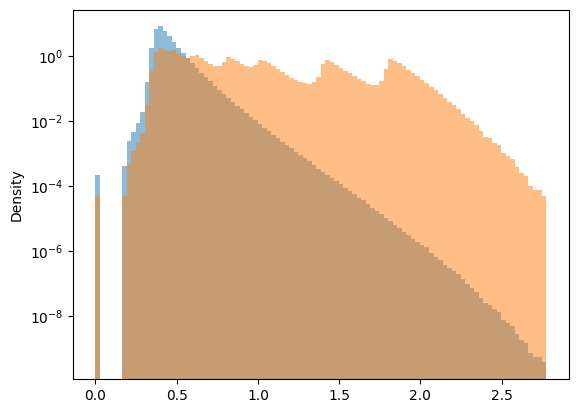

In [4]:
# Test weights

plt.hist(Z[:,0], bins=100, weights=W, density=True, alpha=0.5, label="Gen"),
plt.hist(Z[:,0], bins=100, density=True, alpha=0.5) 

plt.ylabel("Density")
plt.yscale("log")

In [5]:
# specs = [f'{500} <= gen_jet_pts <= {1000}', f' abs_gen_jet_eta < {eta}', f' quality >= {quality}']
# sim = ef.mod.load(*specs, cache_dir =  cache_dir, dataset='sim')

# simjets_f = sim.jets_f
# simjets_i = sim.jets_i

# # count number of instances where simjets_i[j,3] == simjets_i[j+1, 3]
# count = 0
# for j in range(len(simjets_i)-1):
#     if simjets_i[j,3] == simjets_i[j+1, 3]:
#         count += 1  
# print(count, 2 * count / len(simjets_i))
# print(len(simjets_i))


# print(simjets_i[:,3])

# Missing pT Fits

In [6]:
# Collect Pairs

leading_jet_index = np.zeros(pairs.shape[0], dtype=int)
subleading_jet_index = np.zeros(pairs.shape[0], dtype=int)

print(X.shape)
print(Z.shape)


for (i, pair) in enumerate(pairs):

        if use_sim_for_lead:
                pt1 = X[pair[0], 0]
                pt2 = X[pair[1], 0]
        else:
                pt1 = Z[pair[0], 0]
                pt2 = Z[pair[1], 0]

        if pt1 > pt2:
                leading_jet_index[i] = pair[0]
                subleading_jet_index[i] = pair[1]
        else:
                leading_jet_index[i] = pair[1]
                subleading_jet_index[i] = pair[0]

leading_weights = W[leading_jet_index]
subleading_weights = W[subleading_jet_index]    

leading_gen_pt = Z[leading_jet_index, 0]
subleading_gen_pt = Z[subleading_jet_index, 0]

leading_sim_pt = X[leading_jet_index, 0]
subleading_sim_pt = X[subleading_jet_index, 0]

leading_sim_eta = X[leading_jet_index, 1]
subleading_sim_eta = X[subleading_jet_index, 1]

# Get indices of pairs where leading passes cuts
leading_passes_pt_cuts = np.logical_and(leading_sim_pt > pt_lower / momentum_scale, leading_sim_pt < pt_upper / momentum_scale)
leading_passes_eta_cuts = np.abs(leading_sim_eta) < eta
leading_passes_cuts = np.where(np.logical_and(leading_passes_pt_cuts, leading_passes_eta_cuts) > 0)[0]


leading_jet_index = leading_jet_index[leading_passes_cuts]
subleading_jet_index = subleading_jet_index[leading_passes_cuts]


leading_weights = W[leading_jet_index]
subleading_weights = W[subleading_jet_index]    

leading_gen_pt = Z[leading_jet_index, 0]
subleading_gen_pt = Z[subleading_jet_index, 0]

leading_sim_pt = X[leading_jet_index, 0]
subleading_sim_pt = X[subleading_jet_index, 0]

leading_sim_eta = X[leading_jet_index, 1]
subleading_sim_eta = X[subleading_jet_index, 1]

print(leading_weights.shape)


(1412955, 3)
(1412955, 3)
(217102,)


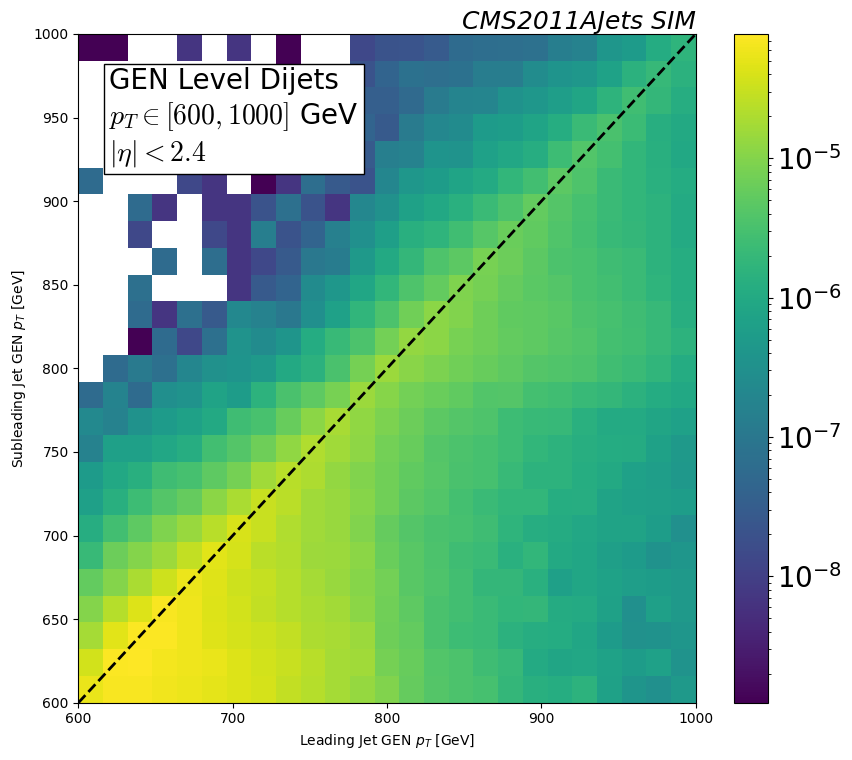

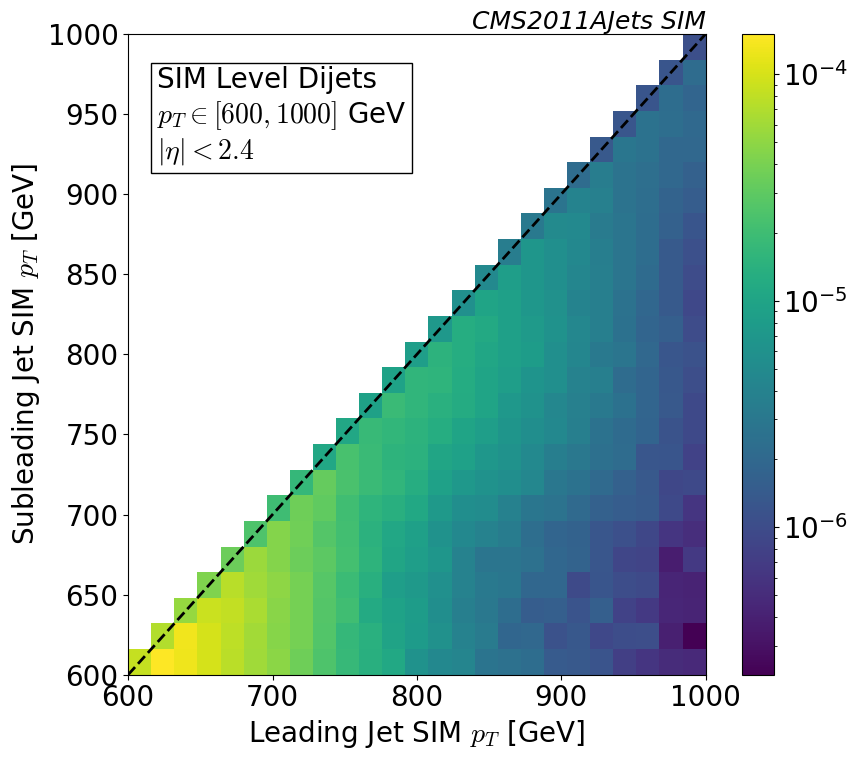

In [7]:
import matplotlib as mpl

# 2d histogram of the leading gen_pt vs the subleading gen_pt for each pair

newplot(width = 9, stamp="CMS2011AJets SIM", stamp_kwargs={"style": "italic", "weight" : None})
plt.hist2d(leading_gen_pt * momentum_scale, subleading_gen_pt * momentum_scale, weights = leading_weights, bins=25, range=[[pt_lower, 1000], [pt_lower, 1000]], norm=mpl.colors.LogNorm(), density = True)

# Line at y = x
plt.plot([pt_lower, pt_upper], [pt_lower, pt_upper], color='black', linestyle='--', linewidth=2)

# Ensure main body of plot is square



plt.xlabel("Leading Jet GEN $p_T$ [GeV]")
plt.ylabel("Subleading Jet GEN $p_T$ [GeV]")
plt.colorbar(   )

# Text in the upper left
t = plt.text(0.05, 0.95, f'GEN Level Dijets\n$p_T \in [{pt_lower}, 1000]$ GeV\n$|\eta| < {eta}$', transform=plt.gca().transAxes,
        verticalalignment='top', backgroundcolor='white')
t.set_bbox(dict(facecolor='white', alpha=1.0, edgecolor='black'))

plt.savefig("Plots/leading_subleading.pdf")

newplot(width = 9, stamp="CMS2011AJets SIM", stamp_kwargs={"style": "italic", "weight" : None})
plt.hist2d(leading_sim_pt * momentum_scale, subleading_sim_pt * momentum_scale, weights= leading_weights, bins=25, range=[[pt_lower, 1000], [pt_lower, 1000]], norm=mpl.colors.LogNorm(), density = True)

# Line at y = x
plt.plot([pt_lower, 1000], [pt_lower, 1000], color='black', linestyle='--', linewidth=2)

# Ensure main body of plot is square



plt.xlabel("Leading Jet SIM $p_T$ [GeV]")
plt.ylabel("Subleading Jet SIM $p_T$ [GeV]")
plt.colorbar(   )

# Text in the upper left
t = plt.text(0.05, 0.95, f'SIM Level Dijets\n$p_T \in [{pt_lower}, 1000]$ GeV\n$|\eta| < {eta}$', transform=plt.gca().transAxes,
        verticalalignment='top', backgroundcolor='white')
t.set_bbox(dict(facecolor='white', alpha=1.0, edgecolor='black'))
plt.savefig("Plots/leading_subleading_SIM.pdf")


0 0.62007886 0.38081583 239.26302790641785
1 0.7085766 0.41100192 297.5746989250183
0 0.630124 0.36399373 266.1302387714386
0 0.625255 0.3814741 243.78088116645813
0 0.66543895 0.37607607 289.3628776073456
0 0.6101309 0.36678624 243.34466457366943
0 0.6101309 0.43983203 170.29887437820435
0 0.62533784 0.37927958 246.05825543403625
0 0.6247588 0.41585675 208.9020311832428
0 0.6281146 0.3780964 250.0181794166565
1 0.70666814 0.37271494 333.95320177078247
0 0.6448866 0.407043 237.8436028957367
0 0.6012066 0.3660293 235.17730832099915
0 0.6283148 0.3720469 256.2679052352905
0 0.61776865 0.37746108 240.30756950378418
0 0.6232942 0.39276066 230.53351044654846
0 0.68016756 0.3988021 281.36545419692993
0 0.6460591 0.37226322 273.79587292671204
0 0.64127344 0.41431302 226.9604206085205
0 0.6077475 0.36690447 240.8430278301239
0 0.6963252 0.36932972 326.99546217918396
0 0.6118598 0.3988604 212.9994034767151
0 0.63288337 0.37899455 253.8888156414032
0 0.63288337 0.40425158 228.63179445266724
0 0.

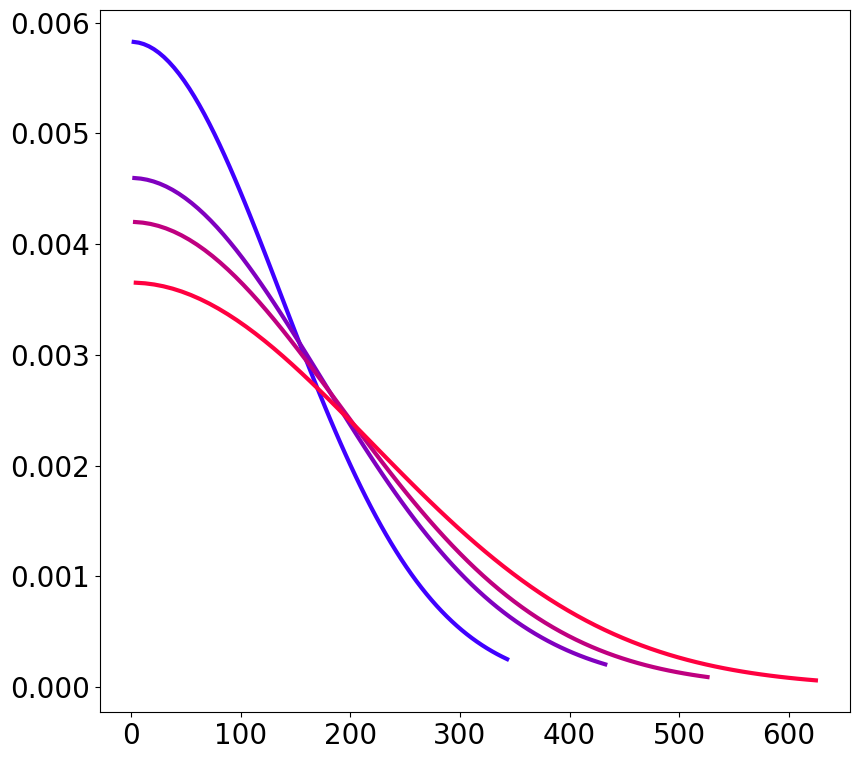

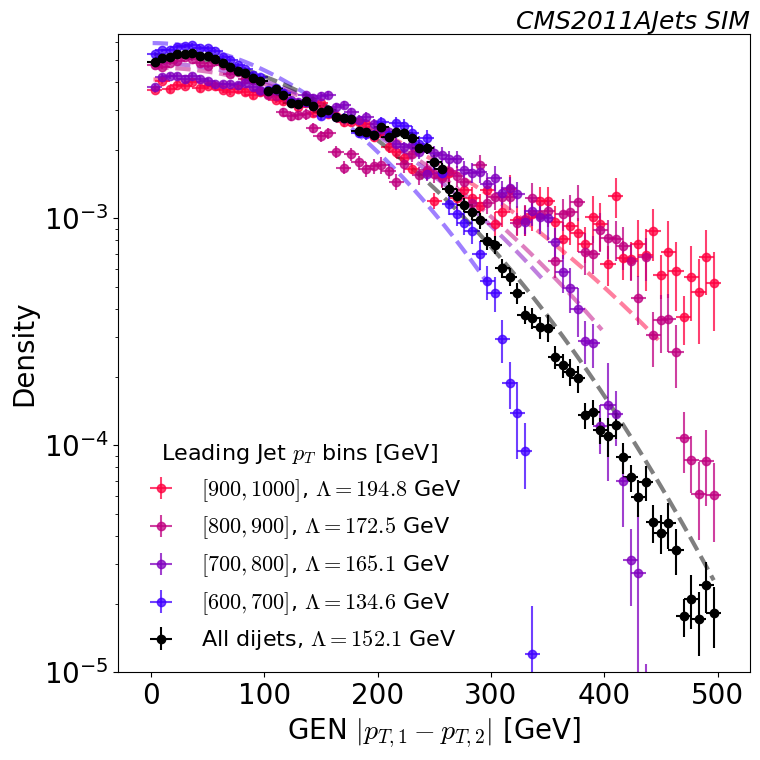

In [8]:
num_pt_bins = 5
num_gev_bins = 75
pt_bins = np.array((600, 700, 800, 900, 1000)) # np.linspace(500, 1000, num_pt_bins + 1)
num_pt_bins = len(pt_bins) - 1

# Initialize array of num_pt_bins arrays
pT_s = [[] for i in range(num_pt_bins + 2)]
diffs = []


leading_jet_px = Z[leading_jet_index, 0] * np.cos(Z[leading_jet_index, 2])
leading_jet_py = Z[leading_jet_index, 0] * np.sin(Z[leading_jet_index, 2])
subleading_jet_px = Z[subleading_jet_index, 0] * np.cos(Z[subleading_jet_index, 2])
subleading_jet_py = Z[subleading_jet_index, 0] * np.sin(Z[subleading_jet_index, 2])

for leading, subleading in zip(leading_sim_pt, subleading_sim_pt):

    difference = momentum_scale * (leading - subleading)
    # randomly flip the sign of the difference
    if np.random.rand() > 0.5:
        difference = difference

    # Find the bin that the difference belongs to
    if momentum_scale * leading > pt_bins[-1]:
        continue
    bin = np.digitize(momentum_scale * leading, pt_bins) - 1
    print(bin, leading, subleading, difference)
    pT_s[bin].append(np.abs(difference))
    diffs.append(np.abs(difference))


bins = np.digitize(momentum_scale * leading_sim_pt, pt_bins) - 1

# fit 1/2a exp(-|x|/a) to each of the distributions
from scipy.optimize import curve_fit, minimize
def func(x, a):

    return 2 / np.sqrt(2 * np.pi * a**2) * np.exp(-np.abs(x**2) / (2 * a**2))

    return 1 / a * np.exp(-np.abs(x**1) / (1 * a**1))


def kl_divergence_fit(p, q):
    return np.sum(np.where(p != 0, p * np.log(p / q), 0))

for i in range(num_pt_bins):

    weights = leading_weights[bins == i]
    pT_s[i] = np.array(pT_s[i])
    hist, bin_edges = np.histogram(pT_s[i], bins=num_gev_bins, density=True, weights=weights)
    bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2

    def kl_divergence_fit(a, x = bin_centers, hist = hist):
        p = hist
        q = func(x, a)
        return np.sum(np.where(p != 0, p * np.log(p / q), 0))


    res = minimize(kl_divergence_fit, 80, args=(bin_centers, hist), method='nelder-mead', options={'xatol': 1e-8, 'disp': True}) 
    popt = res.x
    
    print(popt)
    plt.plot(bin_centers, func(bin_centers, *popt), label=f'Leading $p_T \in [{int(pt_bins[i]) : d},{int(pt_bins[i+1]) : d}]$ GeV', color = ((i+1) / num_pt_bins, 0, 1 - i / num_pt_bins), lw = 3) 


print(pairs.shape)


# # Fit a gaussian to each distribution by minimizing the KL divergence
# from scipy.stats import norm
# from scipy.special import kl_div
# def func(x, mu, sigma):
#     return norm.pdf(x, mu, sigma)

# for i in range(num_pt_bins):
#     pT_s[i] = np.array(pT_s[i])
#     hist, bin_edges = np.histogram(pT_s[i], bins=50, density=True)
#     bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
#     def kl_divergence_fit(a, x = bin_centers, hist = hist):
#         p = hist
#         q = func(x, a)
#         return np.sum(np.where(p != 0, p * np.log(p / q), 0))


#     res = minimize(kl_divergence_fit, 80, args=(bin_centers, hist)) 
#     popt = [res.x]
#     print(popt)
#     plt.plot(bin_centers, func(bin_centers, *popt), label=f'Leading $p_T \in [{int(pt_bins[i]) : d},{int(pt_bins[i+1]) : d}]$ GeV', color = ((i+1) / num_pt_bins, 0, 1 - i / num_pt_bins), lw = 3)


fig, ax = newplot(stamp="CMS2011AJets SIM", stamp_kwargs={"style": "italic", "weight" : None})


gaussian_inclusive_Lambda = 101.7
gaussian_binned_Lambdas = np.array([34.9, 78.1, 125.6, 154.7, 172.6])
gaussian_binned_Lambdas = []

for i in range(num_pt_bins)[::-1]:

    weights = leading_weights[bins == i]
    hist, bin_edges = np.histogram(pT_s[i], range=(-0*pt_bins[i] / 2, pt_bins[i]/2), bins=num_gev_bins, density=True, weights=weights)
    bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
    def kl_divergence_fit(a, x = bin_centers, hist = hist):
            p = hist
            q = func(x, a)
            return np.sum(np.where(p != 0, p * np.log(p / q), 0))


    res = minimize(kl_divergence_fit, 80, args=(bin_centers, hist), method='nelder-mead', options={'xatol': 1e-8, 'disp': True}) 
    popt = res.x
    hist_with_errors(ax, pT_s[i] , range = (-0*500, 500), bins=num_gev_bins, label=f'$[{int(pt_bins[i]) : d},{int(pt_bins[i+1]) : d}]$, $\Lambda = {popt[0] : .1f}$ GeV', color = ((i+1) / num_pt_bins, 0, 1 - i / num_pt_bins), alpha = 0.75, weights=weights)
    hist, bin_edges = np.histogram(pT_s[i], range=(-0*pt_bins[i] / 2, pt_bins[i]/2), bins=100, density=True)
    bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
    gaussian_binned_Lambdas.append(popt[0])

    
    plt.plot(bin_centers, func(bin_centers, *popt), color = ((i+1) / num_pt_bins, 0, 1 - i / num_pt_bins), lw = 3, alpha = 0.5, ls = "--") 




hist, bin_edges = np.histogram(diffs, range=(-0* 1000/ 2, 1000/2), bins=num_gev_bins, density=True, weights=leading_weights)
bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
def kl_divergence_fit(a, x = bin_centers, hist = hist):
        p = hist
        q = func(x, a)
        return np.sum(np.where(p != 0, p * np.log(p / q), 0))


res = minimize(kl_divergence_fit, 80, args=(bin_centers, hist), method='nelder-mead', options={'xatol': 1e-8, 'disp': True}) 
popt = res.x
hist_with_errors(ax, diffs, range = (-0*500, 500), bins=num_gev_bins, label=f'All dijets, $\Lambda = {popt[0] : .1f}$ GeV', color = 'black', weights=leading_weights)
plt.plot(bin_centers, func(bin_centers, *popt), color = "black", lw = 3, alpha = 0.5, ls = "--") 





gaussian_inclusive_Lambda = popt[0]
gaussian_binned_Lambdas = np.array(gaussian_binned_Lambdas)[::-1]


plt.ylim(1e-5, 0.65e-2)
legend = plt.legend(frameon=False, loc = 'lower left', fontsize = 16, title = "Leading Jet $p_T$ bins [GeV]", title_fontsize = 16)
for t in legend.get_texts():
   t.set_ha('right')

plt.yscale('log')
plt.xlabel("GEN $|p_{T,1} - p_{T,2}|$ [GeV]")
plt.ylabel("Density")

plt.savefig("Plots/leading_subleading_difference.pdf")



# CMS Gaussian Scale factors

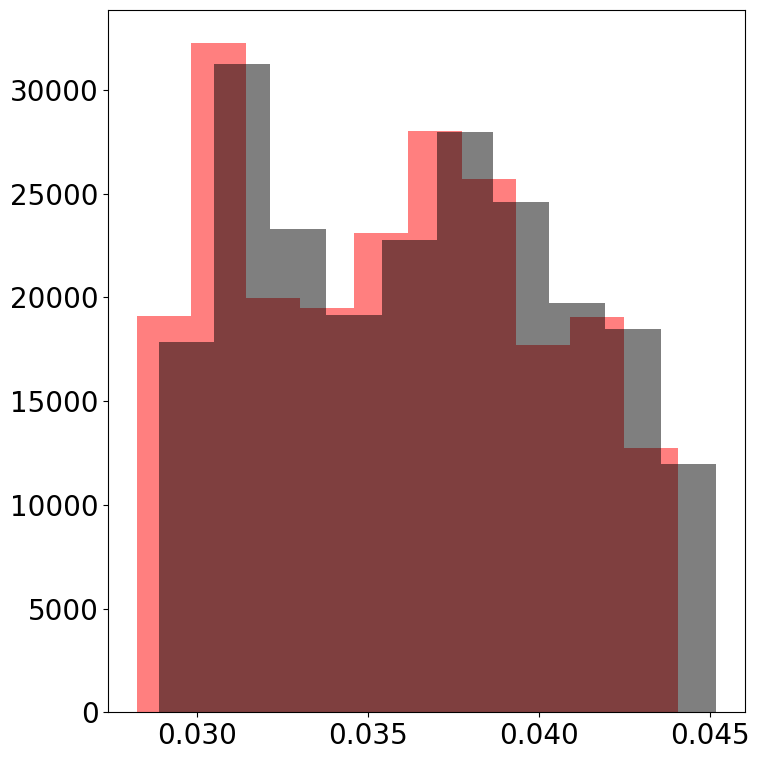

In [9]:
# CMS Result

resolutions_old = [[] for i in range(num_pt_bins)]
resolutions_new = [[] for i in range(num_pt_bins)]


# Get the Scale Factors
leading_Cs = C[leading_jet_index]
subleading_Cs = C[subleading_jet_index]

# Get the pTs
leading_sim_pts = X[leading_jet_index]
subleading_sim_pts = X[subleading_jet_index]

# Get the GEN predictions
leading_predicts = leading_sim_pts[:,0] * leading_Cs
subleading_predicts = subleading_sim_pts[:,0] * subleading_Cs




bins = np.digitize(leading_sim_pt * momentum_scale, pt_bins) - 1
for (i, bin) in enumerate(bins):
    resolutions_old[bin].append(np.abs(leading_predicts[i] - subleading_predicts[i]))
    resolutions_new[bin].append(np.abs(leading_predicts[i] - subleading_predicts[i]))

# Get the JERs
res1 = (1 / 1.15)*leading_predicts * np.sqrt( 30/(momentum_scale * leading_predicts)**2 + 0.81/(momentum_scale * leading_predicts) + 0.04**2   ) 
res2 = (1 / 1.15)*subleading_predicts * np.sqrt( 30/(momentum_scale * subleading_predicts)**2 + 0.81/(momentum_scale * subleading_predicts) + 0.04**2   ) 



# Calculate
Lambda = gaussian_binned_Lambdas[bins] / momentum_scale
detector_jet1 = np.copy(leading_predicts)
detector_jet2 = np.copy(subleading_predicts)
var = np.sqrt(Lambda**2 + res1**2 + res2**2)
p1hathat = (detector_jet1 * Lambda**2 + detector_jet1 * res2**2 - detector_jet2 * res1**2) / var**2
p2hathat = (detector_jet2 * Lambda**2 - detector_jet1 * res2**2 + detector_jet2 * res1**2) / var**2

var1hathat = res1 * np.sqrt((Lambda**2 + res2**2) / var**2)
var2hathat = res2 * np.sqrt((Lambda**2 + res1**2) / var**2)


resolutions_old = [[] for i in range(num_pt_bins)]
resolutions_new = [[] for i in range(num_pt_bins)]

for (i, bin) in enumerate(bins[:150000]):
    resolutions_old[bin].append(np.abs(res1[i]))
    resolutions_new[bin].append(np.abs(var1hathat[i]))

for (i, bin) in enumerate(bins[:150000]):
    resolutions_old[bin].append(np.abs(res2[i]))
    resolutions_new[bin].append(np.abs(var2hathat[i]))


plt.hist(var1hathat, alpha = 0.5,)
plt.hist(res1, alpha = 0.5)

# Recalculate for inclusive
Lambda = gaussian_inclusive_Lambda/ momentum_scale
detector_jet1 = np.copy(leading_predicts)
detector_jet2 = np.copy(subleading_predicts)
var = np.sqrt(Lambda**2 + res1**2 + res2**2)
p1hathat = (detector_jet1 * Lambda**2 + detector_jet1 * res2**2 - detector_jet2 * res1**2) / var**2
p2hathat = (detector_jet2 * Lambda**2 - detector_jet1 * res2**2 + detector_jet2 * res1**2) / var**2

var1hathat = res1 * np.sqrt((Lambda**2 + res2**2) / var**2)
var2hathat = res2 * np.sqrt((Lambda**2 + res1**2) / var**2)

In [10]:

# resolutions_old = [[] for i in range(num_pt_bins)]
# resolutions_new = [[] for i in range(num_pt_bins)]


# for leading_index, subleading_index in zip(leading_jet_index, subleading_jet_index):

#     leading_C = C[leading_index]
#     subleading_C = C[subleading_index]

#     leading_sim_pt = X[leading_index, 0]
#     subleading_sim_pt = X[subleading_index, 0]

#     leading_gen_pt = Z[leading_index, 0]
#     subleading_gen_pt = Z[subleading_index, 0]
#     bin = np.digitize(momentum_scale * leading, pt_bins) - 1

#     # Get the GEN predictions
#     leading_predicts = leading_sim_pts[:,0] * leading_Cs
#     subleading_predicts = subleading_sim_pts[:,0] * subleading_Cs

#     # Get the JERs
#     res1 = 1.00*leading_predicts * np.sqrt( 30/(momentum_scale * leading_predicts)**2 + 0.81/(momentum_scale * leading_predicts) + 0.04**2   ) 
#    REF res2 = 1.00*subleading_predicts * np.sqrt( 30/(momentum_scale * subleading_predicts)**2 + 0.81/(momentum_scale * subleading_predicts) + 0.04**2   ) 

    
#     # Calculate
#     Lambda = gaussian_binned_Lambdas[bin] / momentum_scale
#     detector_jet1 = np.copy(leading_predicts)
#     detector_jet2 = np.copy(subleading_predicts)
#     var = np.sqrt(Lambda**2 + res1**2 + res2**2)
#     p1hathat = (detector_jet1 * Lambda**2 + detector_jet1 * res2**2 - detector_jet2 * res1**2) / var**2
#     p2hathat = (detector_jet2 * Lambda**2 - detector_jet1 * res2**2 + detector_jet2 * res1**2) / var**2

#     var1hathat = np.sqrt(1/(1/Lambda**2 + 1/res1**2))
#     var2hathat = np.sqrt(1/(1/Lambda**2 + 1/res2**2))
    
#     resolutions_old[bin].append(res1)
#     resolutions_old[bin].append(res2)
#     resolutions_new[bin].append(var1hathat)
#     resolutions_new[bin].append(var2hathat)




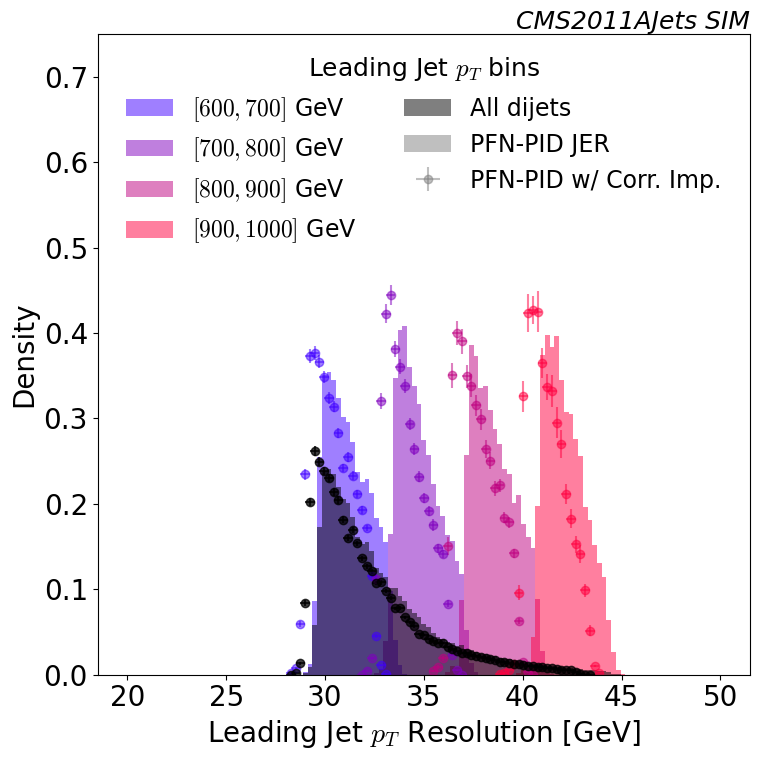

In [11]:
fig, ax = newplot(stamp="CMS2011AJets SIM", stamp_kwargs={"style": "italic", "weight" : None})
hist_bins = 125
lower_lim = 20
upper_lim = 50

# hist_with_errors(ax, momentum_scale * np.array(var1hathat), weights= leading_weights, range = (lower_lim, upper_lim), bins=hist_bins, color = "black", alpha = 0.5)
# plt.hist(momentum_scale * np.array(res1), weights= leading_weights, range = (lower_lim, upper_lim), bins=hist_bins, color = "black", alpha = 0.5, density=True)


for i in range(num_pt_bins):
    temp = leading_weights[:150000]
    weights = temp[bins[:150000] == i]

    # Concatentate weights to itself

    resolutions_old[i] = np.array(resolutions_old[i])
    resolutions_new[i] = np.array(resolutions_new[i])

    size = resolutions_old[i].shape[0]
    

    # print(resolutions_old[i].shape, resolutions_new[i].shape)
    hist_with_errors(ax, momentum_scale * resolutions_new[i][:size //2], range = (lower_lim, upper_lim), bins=hist_bins, color = ((i+1) / num_pt_bins, 0, 1 - i / num_pt_bins), alpha = 0.5, weights=weights)
    plt.hist(momentum_scale * resolutions_old[i][:size //2], range = (lower_lim, upper_lim), bins=hist_bins, label=f'$[{int(pt_bins[i]) : d},{int(pt_bins[i+1]) : d}]$ GeV', color = ((i+1) / num_pt_bins, 0, 1 - i / num_pt_bins), alpha = 0.5, density=True, weights=weights)



hist_with_errors(ax, momentum_scale * np.array(var1hathat), weights= leading_weights, range = (lower_lim, upper_lim), bins=hist_bins, color = "black", alpha = 0.75)
plt.hist(momentum_scale * np.array(res1), weights= leading_weights, range = (lower_lim, upper_lim), bins=hist_bins, color = "black", alpha = 0.5, density=True, label = "All dijets")



plt.hist([35], weights = [0], color = "grey", label = "PFN-PID JER", alpha = 0.5, lw = 2)
plt.errorbar([35], [-1], xerr = [0], yerr = [0], color = "grey", alpha = 0.5, ls = "none", fmt = 'o', label = "PFN-PID w/ Corr. Imp.")


plt.xlabel("Leading Jet $p_T$ Resolution [GeV]")
plt.ylabel("Density")
legend = plt.legend(loc = "upper center", frameon=False, title = "Leading Jet $p_T$ bins", title_fontsize = 18, fontsize = 17, ncol = 2)
for t in legend.get_texts():
   t.set_ha('right')



plt.ylim(0, 0.75)
plt.savefig("Plots/leading_resolution_pfn.pdf")


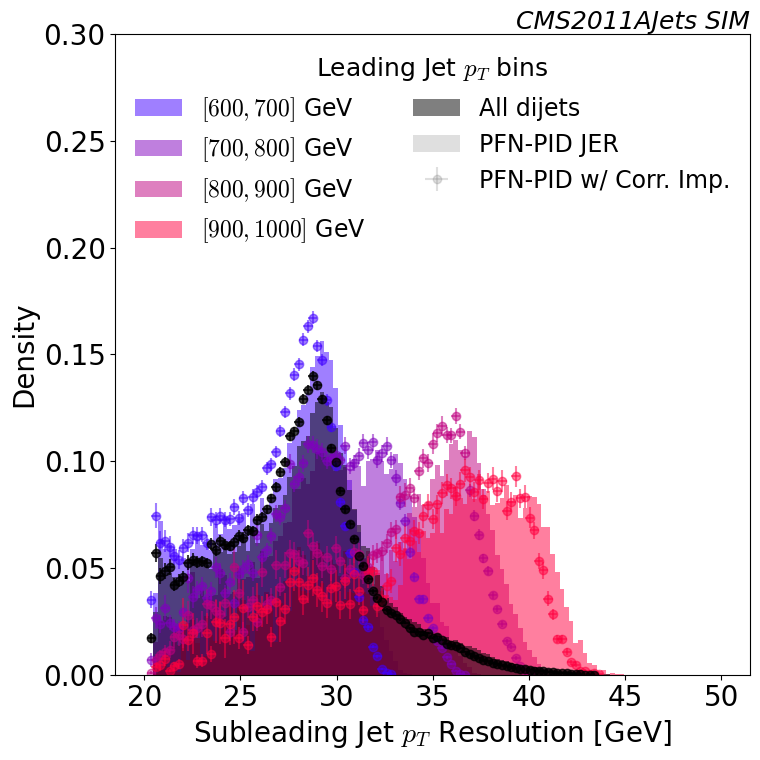

In [12]:
fig, ax = newplot(stamp="CMS2011AJets SIM", stamp_kwargs={"style": "italic", "weight" : None})
hist_bins = 125
lower_lim = 20
upper_lim = 50

# hist_with_errors(ax, momentum_scale * np.array(var1hathat), weights= leading_weights, range = (lower_lim, upper_lim), bins=hist_bins, color = "black", alpha = 0.5)
# plt.hist(momentum_scale * np.array(res1), weights= leading_weights, range = (lower_lim, upper_lim), bins=hist_bins, color = "black", alpha = 0.5, density=True)


for i in range(num_pt_bins):
    temp = leading_weights[:150000]
    weights = temp[bins[:150000] == i]

    # Concatentate weights to itself

    resolutions_old[i] = np.array(resolutions_old[i])
    resolutions_new[i] = np.array(resolutions_new[i])

    size = resolutions_old[i].shape[0]
    

    # print(resolutions_old[i].shape, resolutions_new[i].shape)
    hist_with_errors(ax, momentum_scale * resolutions_new[i][size //2:], range = (lower_lim, upper_lim), bins=hist_bins, color = ((i+1) / num_pt_bins, 0, 1 - i / num_pt_bins), alpha = 0.5, weights=weights)
    plt.hist(momentum_scale * resolutions_old[i][size //2:], range = (lower_lim, upper_lim), bins=hist_bins, label=f'$[{int(pt_bins[i]) : d},{int(pt_bins[i+1]) : d}]$ GeV', color = ((i+1) / num_pt_bins, 0, 1 - i / num_pt_bins), alpha = 0.5, density=True, weights=weights)



hist_with_errors(ax, momentum_scale * np.array(var2hathat), weights= leading_weights, range = (lower_lim, upper_lim), bins=hist_bins, color = "black", alpha = 0.75)
plt.hist(momentum_scale * np.array(res2), weights= leading_weights, range = (lower_lim, upper_lim), bins=hist_bins, color = "black", alpha = 0.5, density=True, label = "All dijets")



plt.hist([35], weights = [0], color = "grey", label = "PFN-PID JER", alpha = 0.25, lw = 2)
plt.errorbar([35], [-1], xerr = [0], yerr = [0], color = "grey", alpha = 0.25, ls = "none", fmt = 'o', label = "PFN-PID w/ Corr. Imp.")


plt.xlabel("Subleading Jet $p_T$ Resolution [GeV]")
plt.ylabel("Density")
legend = plt.legend(loc = "upper center", frameon=False, title = "Leading Jet $p_T$ bins", title_fontsize = 18, fontsize = 17, ncol = 2)
for t in legend.get_texts():
   t.set_ha('right')



plt.ylim(0, 0.3)
plt.savefig("Plots/subleading_resolution_pfn.pdf")


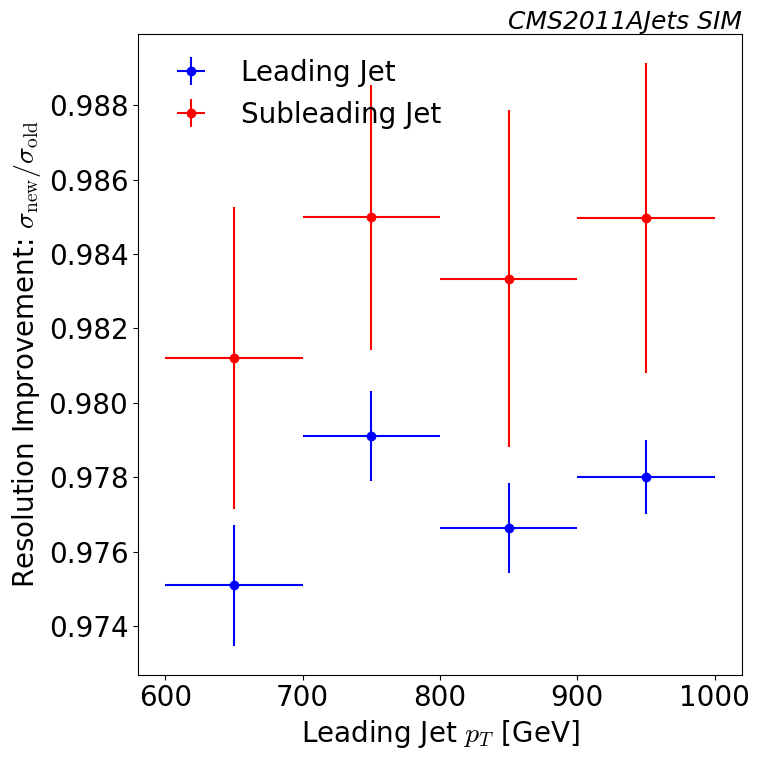

In [13]:
pt_bin_centers = (pt_bins[:-1] + pt_bins[1:]) / 2
pt_bin_widths = (pt_bins[1:] - pt_bins[:-1])[0]
leading_means = []
subleading_means = []
leading_stds = []
subleading_stds = []

newplot(stamp="CMS2011AJets SIM", stamp_kwargs={"style": "italic", "weight" : None})

for i in range(num_pt_bins):

    temp = leading_weights[:150000]
    weights = temp[bins[:150000] == i]
    size = resolutions_old[i].shape[0]
    leading_resolution_ratios = resolutions_new[i][:size //2] / resolutions_old[i][:size //2]
    subleading_resolution_ratios = resolutions_new[i][size //2:] / resolutions_old[i][size //2:]

    leading_means.append(np.average(leading_resolution_ratios, weights=weights))
    subleading_means.append(np.average(subleading_resolution_ratios, weights=weights))
    leading_stds.append(np.sqrt(np.average((leading_resolution_ratios - leading_means[-1])**2, weights=weights)))
    subleading_stds.append(np.sqrt(np.average((subleading_resolution_ratios - subleading_means[-1])**2, weights=weights)))

plt.errorbar(pt_bin_centers, leading_means, yerr = leading_stds, xerr= pt_bin_widths/2, fmt = 'o', label = "Leading Jet", color = "blue")
plt.errorbar(pt_bin_centers, subleading_means, yerr = subleading_stds, xerr= pt_bin_widths/2, fmt = 'o', label = "Subleading Jet", color = "red")
plt.legend(loc = "upper left", frameon=False)

plt.xlabel("Leading Jet $p_T$ [GeV]")
plt.ylabel("Resolution Improvement: $\sigma_{\mathrm{new}} / \sigma_{\mathrm{old}}$")

plt.savefig("Plots/improvement_pfn.pdf")



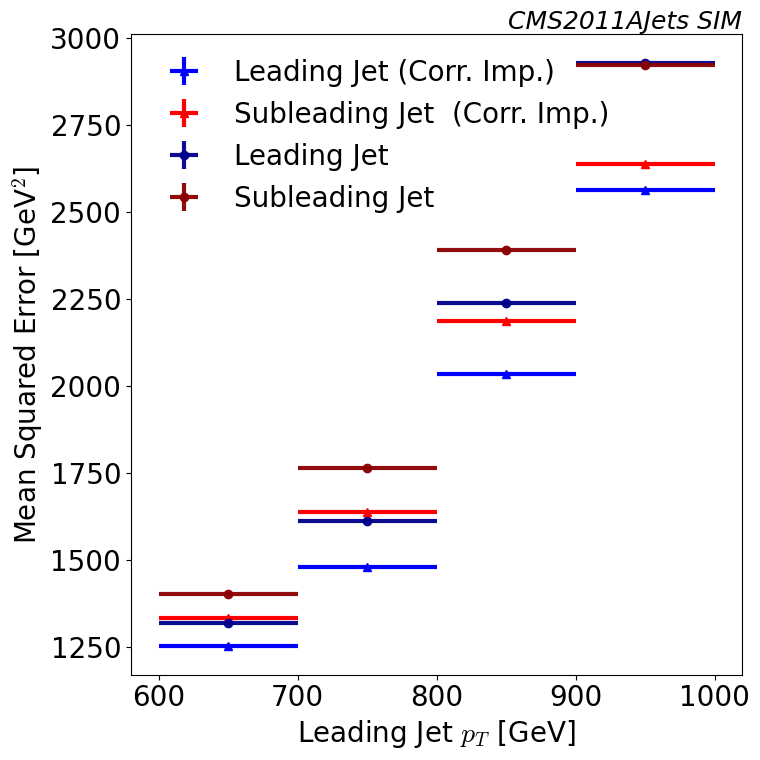

In [14]:
# Mean Squared Error 


z1 = momentum_scale * leading_predicts
z2 = momentum_scale * subleading_predicts
sigma_1 =  momentum_scale * res1
sigma_2 =  momentum_scale * res2




def z1_prime(z1, z2, sigma1, sigma2, Lambda):
    sigma = np.sqrt(sigma1**2 + sigma2**2 + Lambda**2)

    return (z1*(Lambda**2 + sigma2**2) + z2*sigma1**2)/(sigma**2)


def z2_prime(z1, z2, sigma1, sigma2, Lambda):
    sigma = np.sqrt(sigma1**2 + sigma2**2 + Lambda**2)

    return (z2*(Lambda**2 + sigma1**2) + z1*sigma2**2)/(sigma**2)

def sigma1_prime(z1, z2, sigma1, sigma2, Lambda):
    
    return sigma1 * np.sqrt(sigma2**2 + Lambda**2) / np.sqrt(sigma1**2 + sigma2**2 +  Lambda**2)

def sigma2_prime(z1, z2, sigma1, sigma2, Lambda):
    
    return sigma2 * np.sqrt(sigma1**2 + Lambda**2) / np.sqrt(sigma1**2 + sigma2**2 +  Lambda**2)


z1_primes = z1_prime(z1, z2, sigma_2, sigma_2, Lambda * momentum_scale)
z2_primes = z2_prime(z1, z2, sigma_2, sigma_2, Lambda * momentum_scale)

# plt.hist( (z1_primes - leading_gen_pt * momentum_scale)**2 , bins = 100, weights=leading_weights, density=True, alpha = 0.5, range = (0, 100))
# plt.hist( (z1 - leading_gen_pt * momentum_scale)**2 , bins = 100, weights=leading_weights, density=True, alpha = 0.5, range = (0, 100))

# prime_avg = np.average((z1_primes - leading_gen_pt * momentum_scale)**2, weights=leading_weights / np.sum(leading_weights))
# old_avg = np.average((z1 - leading_gen_pt * momentum_scale)**2, weights=leading_weights / np.sum(leading_weights))

# print(prime_avg, old_avg)
# print(1 - prime_avg / old_avg)

# print(np.average((z1_primes - leading_gen_pt * momentum_scale)**2, weights=leading_weights))
# print(np.average((z1 - leading_gen_pt * momentum_scale)**2, weights=leading_weights))

newplot(stamp="CMS2011AJets SIM", stamp_kwargs={"style": "italic", "weight" : None})

leading_prime_avgs = []
leading_old_avgs = []
subleading_prime_avgs = []
subleading_old_avgs = []

for i in range(num_pt_bins):

    z1_primes = z1_primes[:150000]
    z2_primes = z2_primes[:150000]
    z1 = z1[:150000]
    z2 = z2[:150000]

    temp = leading_weights[:150000]
    weights = temp[bins[:150000] == i]

    leading_gen_pt = leading_gen_pt[:150000]
    subleading_gen_pt = subleading_gen_pt[:150000]


    leading_prime_avg = np.average((z1_primes[bins[:150000] == i] - leading_gen_pt[bins[:150000] == i] * momentum_scale)**2, weights=weights / np.sum(weights))
    leading_old_avg = np.average((z1[bins[:150000] == i] - leading_gen_pt[bins[:150000] == i] * momentum_scale)**2, weights=weights / np.sum(weights))

    subleading_prime_avg = np.average((z2_primes[bins[:150000] == i] - subleading_gen_pt[bins[:150000] == i] * momentum_scale)**2, weights=weights / np.sum(weights))
    subleading_old_avg = np.average((z2[bins[:150000] == i] - subleading_gen_pt[bins[:150000] == i] * momentum_scale)**2, weights=weights / np.sum(weights))

    leading_prime_avgs.append(leading_prime_avg)
    leading_old_avgs.append(leading_old_avg)
    subleading_prime_avgs.append(subleading_prime_avg)
    subleading_old_avgs.append(subleading_old_avg)


plt.errorbar(pt_bin_centers, leading_prime_avgs, yerr = 0, xerr= pt_bin_widths/2, fmt = '^', label = "Leading Jet (Corr. Imp.)", color = "blue", lw = 3)
plt.errorbar(pt_bin_centers, subleading_prime_avgs, yerr = 0, xerr= pt_bin_widths/2, fmt = '^', label = "Subleading Jet  (Corr. Imp.)", color = "red", lw = 3)

plt.errorbar(pt_bin_centers, leading_old_avgs, yerr = 0, xerr= pt_bin_widths/2, fmt = 'o', label = "Leading Jet", color = "darkblue", alpha = 0.95, lw = 3)
plt.errorbar(pt_bin_centers, subleading_old_avgs, yerr = 0, xerr= pt_bin_widths/2, fmt = 'o', label = "Subleading Jet", color = "darkred", alpha = 0.95, lw = 3)

plt.legend(loc = "upper left", frameon=False)

plt.xlabel("Leading Jet $p_T$ [GeV]")
plt.ylabel("Mean Squared Error [GeV$^2$]")

plt.savefig("Plots/MSE_pfn.pdf")


